In [25]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from math import pi
from pprint import pprint

from bokeh.plotting import figure, show
from bokeh.io import curdoc, output_notebook, export_png
from bokeh.models import BoxZoomTool, ResetTool, PanTool, WheelZoomTool, HoverTool, AnnularWedge, ColumnDataSource, Legend, LegendItem, Plot, Range1d
from bokeh.palettes import PuBu

from tqdm import tqdm
import warnings
import ast

warnings.filterwarnings("ignore")

In [3]:
data = pd.read_csv("./data/augmented_data.csv")

In [4]:
data.shape

(83929, 60)

In [5]:
data.head()

,period,minute,second,possession,duration,competition_id,season_id,match_id,timestamp,team,...,good_foot,shots_so_far,xg_so_far,game_state,was_leading,past_minute,past_15,own_past_minute,own_past_15,is_extra_time
0,1.0,0.0,47.0,4.0,0.56,FA Women's Super League,2018/2019,7298.0,00:00:47.620,Chelsea FCW,...,True,0,0.000000,0.0,0,1.0,1.0,1.0,1.0,False
1,1.0,5.0,12.0,15.0,0.40,FA Women's Super League,2018/2019,7298.0,00:05:12.780,Chelsea FCW,...,True,1,0.018856,0.0,0,1.0,2.0,1.0,2.0,False
2,1.0,5.0,41.0,16.0,0.48,FA Women's Super League,2018/2019,7298.0,00:05:41.940,Chelsea FCW,...,False,2,0.060703,0.0,0,2.0,3.0,2.0,3.0,False
3,1.0,5.0,43.0,16.0,0.16,FA Women's Super League,2018/2019,7298.0,00:05:43.900,Chelsea FCW,...,True,3,0.087385,0.0,0,3.0,4.0,3.0,4.0,False
4,1.0,5.0,46.0,16.0,1.48,FA Women's Super League,2018/2019,7298.0,00:05:46.380,Chelsea FCW,...,False,4,0.193604,0.0,0,4.0,5.0,4.0,5.0,False


In [6]:
data.nunique()

period                     5
minute                   139
second                    60
possession               290
duration               77925
competition_id            17
season_id                 41
match_id                3312
timestamp              82726
team                     288
player                  5638
freeze_frame           82866
play_pattern               9
position                  25
player_type                5
location_x               635
location_x_distance      635
location_y               701
location_y_distance      471
technique                  7
body_part                  4
type                       5
is_penalty                 2
is_header                  2
first_time                 2
open_goal                  2
one_on_one                 2
aerial_won                 2
follows_dribble            2
under_pressure             2
pass_duration          11897
pass_angle             10504
pass_type                  8
pass_height                4
pass_length   

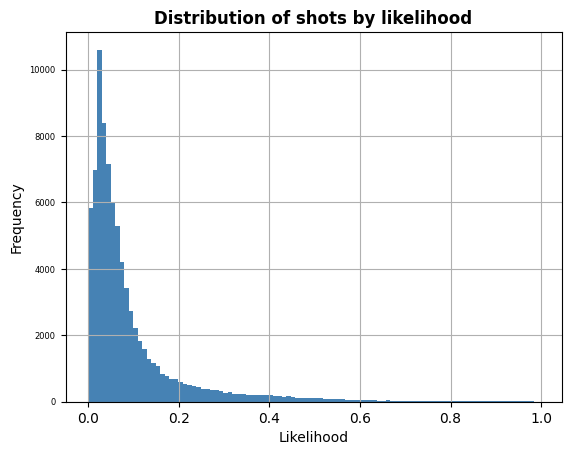

In [7]:
ax = data[data["is_penalty"] == False]["statsbomb_xg"].hist(bins=100, xlabelsize=10, ylabelsize=6, color="steelblue")
ax.set_title('Distribution of shots by likelihood', weight='bold')
ax.set_xlabel('Likelihood')
ax.set_ylabel('Frequency')
plt.show()

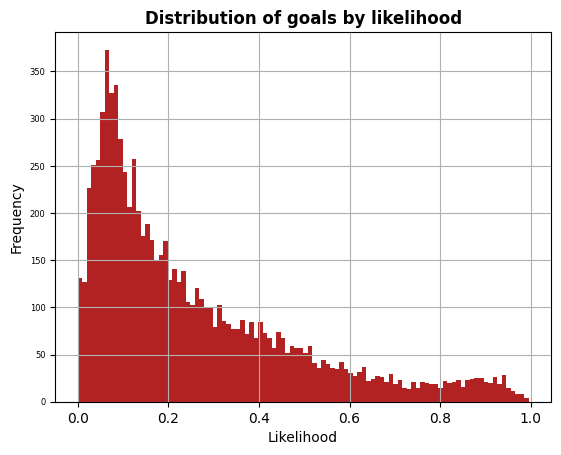

In [8]:
# ax = data[data["is_penalty"] == False]["statsbomb_xg"].hist(bins=100, xlabelsize=10, ylabelsize=6, color="steelblue")
ax = data[(data["is_goal"] == True) & (data["is_penalty"] == False)]["statsbomb_xg"].hist(bins=100, xlabelsize=10, ylabelsize=6, color="firebrick")
ax.set_title('Distribution of goals by likelihood', weight='bold')
ax.set_xlabel('Likelihood')
ax.set_ylabel('Frequency')
plt.show()

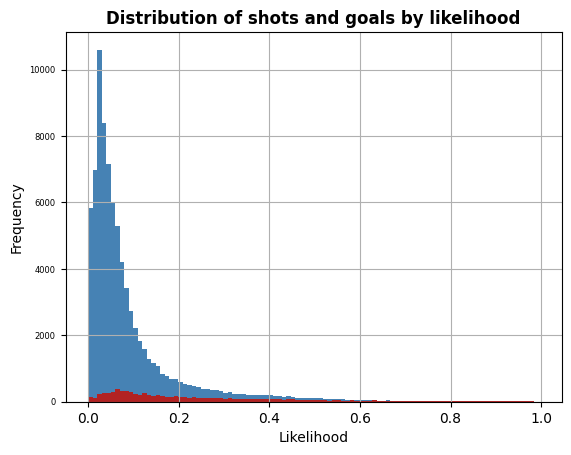

In [9]:
ax = data[data["is_penalty"] == False]["statsbomb_xg"].hist(bins=100, xlabelsize=10, ylabelsize=6, color="steelblue")
ax2 = data[(data["is_goal"] == True) & (data["is_penalty"] == False)]["statsbomb_xg"].hist(bins=100, xlabelsize=10, ylabelsize=6, color="firebrick")
ax.set_title('Distribution of shots and goals by likelihood', weight='bold')
ax.set_xlabel('Likelihood')
ax.set_ylabel('Frequency')
plt.show()

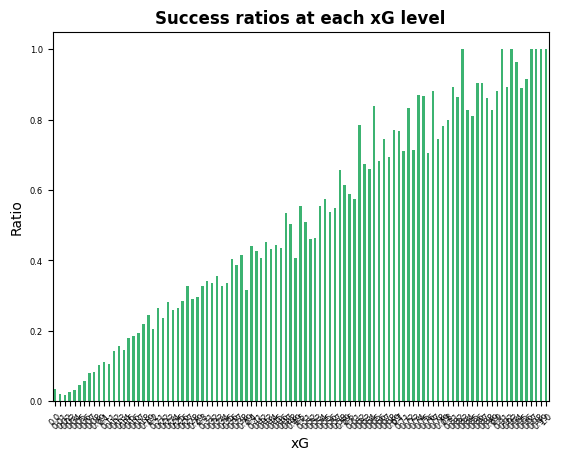

In [10]:
data["temp"] = data["statsbomb_xg"].apply(lambda x: round(x, 2))
shots = data.groupby(["temp"])["temp"].count()
goals = data[data["is_goal"] == True].groupby(["temp"])["temp"].count()
ratios = goals/shots
data.drop("temp", axis=1, inplace=True)

ax = ratios.plot.bar(y="temp", color="mediumseagreen", rot=45, fontsize=6)
ax.set_title('Success ratios at each xG level', weight='bold')
ax.set_xlabel('xG')
ax.set_ylabel('Ratio')
plt.show()

In [11]:
def plot_coordinates(x, y, title='Scatter Plot of X and Y Coordinates', color="cyan", color_map=None, size_map=None, legend_map=None):
    output_notebook()
    curdoc().theme = 'dark_minimal'

    p = figure(width=800, height=600, title=title)

    use_color = color_map if color_map is not None else color
    use_size = size_map if size_map is not None else 5

    if isinstance(use_color, str):
        p.scatter(x, y, size=use_size, color=use_color, alpha=0.5, legend_label='Shot')
    else:
        unique_colors = np.unique(use_color)
        legend_items = []

        for color in unique_colors:
            label = legend_map.get(color, str(color))
            p.scatter(x, y, size=use_size, color=use_color, alpha=0.5, legend_label=label)
            legend_items.append((label, [p.circle([], [], color=color, size=10, legend_label=label)]))

    p.x_range.start = 0
    p.y_range.start = 0
    p.x_range.end = 120
    p.y_range.end = 80

    p.xaxis.axis_label = 'X Coordinate'
    p.yaxis.axis_label = 'Y Coordinate'
    p.grid.visible = True
    p.segment(x0=102, y0=18, x1=102, y1=62, color="white", line_width=0.5)
    p.segment(x0=102, y0=18, x1=120, y1=18, color="white", line_width=0.5)
    p.segment(x0=102, y0=62, x1=120, y1=62, color="white", line_width=0.5)

    p.legend.title = 'Legend'
    p.legend.location = 'top_left'
    p.legend.click_policy = 'hide'

    # hover = HoverTool(tooltips=[('X', '@x'), ('Y', '@y')])
    # p.add_tools(hover)
    # p.add_tools(PanTool(), BoxZoomTool(), WheelZoomTool(), ResetTool())
    show(p)

In [50]:
def plot_shot(x, y, title='Shot Scenario', color="cyan", color_map=None, size_map=None, legend_map=None, angles=False):
    output_notebook()
    curdoc().theme = 'dark_minimal'

    p = figure(width=800, height=600, title=title)
    p.background_fill_color = "forestgreen"

    use_color = color_map if color_map is not None else color
    use_size = size_map if size_map is not None else 5

    if isinstance(use_color, str):
        p.scatter(x, y, size=use_size, color=use_color, alpha=0.5, legend_label='Shot')
    else:
        unique_colors = np.unique(use_color)
        legend_items = []

        for this_color in unique_colors:
            label = legend_map.get(this_color, str(this_color))
            p.scatter(x, y, size=use_size, color=use_color, alpha=0.5, legend_label=label)
            legend_items.append((label, [p.circle([], [], color=this_color, size=10, legend_label=label)]))

    p.x_range.start = 0
    p.y_range.start = 0
    p.x_range.end = 120
    p.y_range.end = 80

    p.xaxis.axis_label = 'X Coordinate'
    p.yaxis.axis_label = 'Y Coordinate'
    p.grid.visible = True

    # penalty boxes
    p.segment(x0=102, y0=18, x1=102, y1=62, color="snow", line_width=2)
    p.segment(x0=102, y0=18, x1=120, y1=18, color="snow", line_width=2)
    p.segment(x0=102, y0=62, x1=120, y1=62, color="snow", line_width=2)
    p.segment(x0=18, y0=18, x1=18, y1=62, color="snow", line_width=2)
    p.segment(x0=18, y0=18, x1=0, y1=18, color="snow", line_width=2)
    p.segment(x0=18, y0=62, x1=0, y1=62, color="snow", line_width=2)

    # goal and circle
    p.segment(x0=120, y0=36, x1=120, y1=44, color="red", line_width=5)
    p.segment(x0=60, y0=0, x1=60, y1=80, color="snow", line_width=2)
    p.circle(x = 60, y = 40, radius = 10, color=None, line_color="snow", line_width=2)

    # defender stats
    if angles:
        p.circle(x = x.iloc[-2], y = y.iloc[-2], radius = 3, color=None, line_color="black", line_width=2)
        p.segment(x0=x.iloc[-2], y0=y.iloc[-2], x1=120, y1=36, color="black", line_width=2)
        p.segment(x0=x.iloc[-2], y0=y.iloc[-2], x1=120, y1=44, color="black", line_width=2)

    p.legend.title = 'Legend'
    p.legend.location = 'top_left'
    p.legend.click_policy = 'hide'

    # hover = HoverTool(tooltips=[('X', '@x'), ('Y', '@y')])
    # p.add_tools(hover)
    # p.add_tools(PanTool(), BoxZoomTool(), WheelZoomTool(), ResetTool())
    show(p)

In [13]:
def plot_scatter(x, y, title='Scatter Plot of X and Y Coordinates', x_label='X', y_label='Y', color="cyan", color_map=None, size_map=None, legend_map=None):
    output_notebook()
    curdoc().theme = 'dark_minimal'

    p = figure(width=800, height=600, title=title)

    use_color = color_map if color_map is not None else color
    use_size = size_map if size_map is not None else 8

    if isinstance(use_color, str):
        p.scatter(x, y, size=use_size, color=use_color, alpha=0.5, legend_label='Shot')
    else:
        unique_colors = np.unique(use_color)
        legend_items = []

        for color in unique_colors:
            label = legend_map.get(color, str(color))
            p.scatter(x, y, size=use_size, color=use_color, alpha=0.5, legend_label=label)
            legend_items.append((label, [p.circle([], [], color=color, size=10, legend_label=label)]))

    p.xaxis.axis_label = x_label
    p.yaxis.axis_label = y_label
    p.grid.visible = True

    coefficients = np.polyfit(x, y, 1)
    slope = coefficients[0]
    intercept = coefficients[1]
    trendline = slope * x + intercept
    p.line(x, trendline, line_color='blue', line_width=1, legend_label='Trendline')

    # hover = HoverTool(tooltips=[('X', '@x'), ('Y', '@y')])
    # p.add_tools(hover)
    # p.add_tools(PanTool(), BoxZoomTool(), WheelZoomTool(), ResetTool())
    show(p)

In [14]:
def plot_histogram(data, bins=10, title='Frequency of Data', x_label='Value', y_label='Frequency', is_goal=None):
    output_notebook()
    curdoc().theme = 'dark_minimal'

    p = figure(width=800, height=600, title=title)
    hist, edges = np.histogram(data, bins=bins)
    p.quad(top=hist, bottom=0, left=edges[:-1], right=edges[1:], fill_color='grey', line_color='white', alpha=0.4)

    hist, edges = np.histogram(data[is_goal == True], bins=bins)
    p.quad(top=hist, bottom=0, left=edges[:-1], right=edges[1:], fill_color='cyan', line_color='white', alpha=0.4)

    p.xaxis.axis_label = x_label
    p.yaxis.axis_label = y_label
    p.grid.visible = True

    # p.add_tools(PanTool(), BoxZoomTool(), WheelZoomTool(), ResetTool())
    show(p)

In [15]:
def plot_pass_map(df, title='Pass Map', color_map=None):
    output_notebook()
    curdoc().theme = 'dark_minimal'

    p = figure(width=800, height=600, title=title)
    p.scatter(x=df["location_x"], y=df["location_y"], size=1, color='grey', legend_label='Start')
    p.scatter(x=df["end_location_x"], y=df["end_location_y"], size=1, color='red', legend_label='End')
    for _, row in df.iterrows():
        p.line([row['location_x'], row['end_location_x']], [row['location_y'], row['end_location_y']], line_color=color_map if color_map else "cyan")

    p.x_range.start = 0
    p.y_range.start = 0
    p.x_range.end = 120
    p.y_range.end = 80

    p.xaxis.axis_label = 'X Coordinate'
    p.yaxis.axis_label = 'Y Coordinate'
    p.grid.visible = True

    # hover = HoverTool(tooltips=[('X', '@x'), ('Y', '@y')])
    # p.add_tools(hover)
    # p.add_tools(PanTool(), BoxZoomTool(), WheelZoomTool(), ResetTool())

    show(p)

In [ ]:
def plot_donut_chart(column, title='Donut Chart', color_map=None):
    output_notebook()

    xdr = Range1d(start=-2, end=2)
    ydr = Range1d(start=-2, end=2)

    p = Plot(x_range=xdr, y_range=ydr)
    p.title.text = title
    p.toolbar_location = None

    aggregated = column.value_counts()
    percentages = aggregated.apply(lambda x: x/aggregated.sum())
    angles = percentages.map(lambda x: 2*pi*x).cumsum().tolist()

    source = ColumnDataSource(dict(
        start  = [0] + angles[:-1],
        end    = angles,
        colors = color_map
    ))

    glyph = AnnularWedge(x=0, y=0, inner_radius=1.2, outer_radius=1.8,
                         start_angle="start", end_angle="end",
                         line_color="grey", line_width=3, fill_color="colors")
    r = p.add_glyph(source, glyph)

    legend = Legend(location="center")
    for i, name in enumerate([key for key, value in aggregated.items()]):
        legend.items.append(LegendItem(label=name, renderers=[r], index=i))
    p.add_layout(legend, "center")

    show(p)

In [ ]:
def plot_stacked_donut_chart(column1, column2, title='Stacked Donut Chart', color_map=None):
    output_notebook()

    xdr = Range1d(start=-2, end=2)
    ydr = Range1d(start=-2, end=2)

    p = Plot(x_range=xdr, y_range=ydr)
    p.title.text = title
    p.toolbar_location = None

    aggregated1 = column1.value_counts()
    percentages1 = aggregated1.apply(lambda x: x/aggregated1.sum())
    angles1 = percentages1.map(lambda x: 2*pi*x).cumsum().tolist()

    source1 = ColumnDataSource(dict(
        start  = [0] + angles1[:-1],
        end    = angles1,
        colors = color_map
    ))

    glyph1 = AnnularWedge(x=0, y=0, inner_radius=1, outer_radius=1.35,
                         start_angle="start", end_angle="end",
                         line_color="grey", line_width=2, fill_color="colors")
    r1 = p.add_glyph(source1, glyph1)

    aggregated2 = column2.value_counts()
    percentages2 = aggregated2.apply(lambda x: x/aggregated2.sum())
    angles2 = percentages2.map(lambda x: 2*pi*x).cumsum().tolist()

    source2 = ColumnDataSource(dict(
        start  = [0] + angles2[:-1],
        end    = angles2,
        colors = color_map[:len(angles2)]
    ))

    glyph2 = AnnularWedge(x=0, y=0, inner_radius=1.4, outer_radius=1.75,
                         start_angle="start", end_angle="end",
                         line_color="grey", line_width=2, fill_color="colors")
    r2 = p.add_glyph(source2, glyph2)

    legend = Legend(location="center")
    for i, name in enumerate([key for key, value in aggregated1.items()]):
        legend.items.append(LegendItem(label=name, renderers=[r1], index=i))
    p.add_layout(legend, "center")

    show(p)

In [ ]:
def plot_bar_chart(data_df, column):
    value_counts = data_df[column].value_counts().sort_index()
    plt.figure(figsize=(10, 6))
    value_counts.plot(kind='bar', color='skyblue')
    plt.title(f'Frequency of {column}')
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.xticks(rotation=45)
    plt.show()

In [ ]:
def plot_area_chart(sequence):
    plt.fill_between(range(len(sequence)), sequence, color="skyblue", alpha=0.4)
    plt.plot(sequence, color="Slateblue", alpha=0.6, linewidth=2)
    plt.xlabel("Threshold (times 10)")
    plt.ylabel("F1 score")
    plt.title("ROC")
    plt.show()

In [16]:
data = data[data["type"] != "Penalty"]

In [49]:
plot_shot(data['location_x'], data['location_y'], "Shot Locations", color_map=data["is_goal"].map({True: 'cyan', False: 'grey'}), size_map=data['statsbomb_xg'].apply(lambda x: x*15), legend_map={'cyan': "Goal", 'grey': "Shot"})

Loading BokehJS ...

['cyan' 'grey']
cyan
grey


In [55]:
data["period"]

0        1.0
1        1.0
2        1.0
3        1.0
4        1.0
        ... 
83924    2.0
83925    2.0
83926    2.0
83927    2.0
83928    2.0
Name: period, Length: 82713, dtype: float64

In [ ]:
# plot_histogram(data["location_x"], bins=120, title="Distribution of x-coordinates", x_label="x-coordinate", is_goal=data["is_goal"])

In [ ]:
# plot_histogram(data["location_y"], bins=120, title="Distribution of y-coordinates", x_label="y-coordinate", is_goal=data["is_goal"])

In [ ]:
# shots_per_minute = data['minute'].value_counts().sort_index()[:90]
# plot_scatter(data['minute'].unique()[:91], shots_per_minute, "Shots per Minute", x_label="Minute", y_label="Number of Shots", color="grey", legend_map={'cyan': "Goal", 'grey': "Shot"})

In [ ]:
# shots_per_poss = data['possession'].value_counts().sort_index()[:181]
# plot_scatter(data['possession'].unique()[:180], shots_per_poss, "Shots per Possession", x_label="Possession", y_label="Number of Shots", color="grey", legend_map={'cyan': "Goal", 'grey': "Shot"})

In [ ]:
# goals_per_minute = data[data["is_goal"] == True]['minute'].value_counts().sort_index()[:90]
# plot_scatter(data['minute'].unique()[:91], goals_per_minute, "Goals per Minute", x_label="Minute", y_label="Number of Goals", color="cyan", legend_map={'cyan': "Goal", 'grey': "Shot"})

In [ ]:
# plot_histogram(data["minute"], bins=130, title="Distribution of shot times", x_label="Minute", is_goal=data["is_goal"])

In [ ]:
# restricted_data = data[data["minute"] < 100]
# restricted_data = restricted_data[restricted_data["location_x"] > 70]
# plot_scatter(restricted_data['minute'], restricted_data["location_x"], "x-coordinate of Shots by Minute", x_label="Minute", y_label="x-coordinate", color_map=restricted_data["is_goal"].map({True: 'cyan', False: 'grey'}), legend_map={'cyan': "Goal", 'grey': "Shot"})

In [ ]:
# restricted_data = data[data["minute"] < 100]
# mean_location_y = restricted_data['location_y'].mean()
# deviation_from_mean = abs(restricted_data["location_y"] - mean_location_y)
# plot_scatter(restricted_data['minute'], deviation_from_mean, "y-coordinate of Shots by Minute", x_label="Minute", y_label="y-coordinate deviation", color_map=restricted_data["is_goal"].map({True: 'cyan', False: 'grey'}), legend_map={'cyan': "Goal", 'grey': "Shot"})

In [15]:
data.columns

Index(['period', 'minute', 'second', 'possession', 'duration',
       'competition_id', 'season_id', 'match_id', 'timestamp', 'team',
       'player', 'freeze_frame', 'play_pattern', 'position', 'player_type',
       'location_x', 'location_x_distance', 'location_y',
       'location_y_distance', 'technique', 'body_part', 'type', 'is_penalty',
       'is_header', 'first_time', 'open_goal', 'one_on_one', 'aerial_won',
       'follows_dribble', 'under_pressure', 'pass_duration', 'pass_angle',
       'pass_type', 'pass_height', 'pass_length', 'num_passes',
       'defenders_3m_radius', 'defenders_triangle', 'goalkeeper_x',
       'goalkeeper_y', 'distance_to_goalie', 'shooting_range', 'open_range',
       'goal_distance', 'best_distance', 'statsbomb_xg', 'end_location_x',
       'end_location_y', 'is_goal', 'shot_angle', 'good_foot', 'shots_so_far',
       'xg_so_far', 'game_state', 'was_leading', 'past_minute', 'past_15',
       'own_past_minute', 'own_past_15', 'is_extra_time'],
      d

In [16]:
play_pattern_numeric, _ = pd.factorize(data["play_pattern"])
plot_histogram(play_pattern_numeric, bins=9, title="Frequency of shots per play pattern", x_label="Plays", is_goal=data["is_goal"])
data["play_pattern"].value_counts()

Loading BokehJS ...

Regular Play      27864
From Free Kick    17311
From Throw In     14791
From Corner       13392
From Counter       3796
From Goal Kick     3156
From Keeper        1284
From Kick Off       962
Other               157
Name: play_pattern, dtype: int64

In [17]:
headers = data[data["is_header"] == True]
header_play_pattern_numeric, _ = pd.factorize(headers["play_pattern"])
plot_histogram(header_play_pattern_numeric, bins=9, title="Frequency of headers per play pattern", x_label="Plays", is_goal=headers["is_goal"])
headers["play_pattern"].value_counts()

Loading BokehJS ...

From Corner       5803
From Free Kick    2967
Regular Play      2290
From Throw In     1648
From Goal Kick     273
From Keeper        108
From Kick Off       91
From Counter        86
Other               18
Name: play_pattern, dtype: int64

In [42]:
plot_histogram(data[data["goalkeeper_x"] > 80]["goalkeeper_x"], bins=120, title="Distribution of shots by distance from goalie", x_label="Shots", is_goal=data[data["goalkeeper_x"] > 80]["is_goal"])

Loading BokehJS ...

In [43]:
plot_histogram(data["distance_to_goalie"], bins=120, title="Distribution of shots by distance from goalie", x_label="Distance", is_goal=data["is_goal"])

Loading BokehJS ...

In [28]:
plot_histogram(data["defenders_triangle"], bins=13, title="Distribution of shots by defenders in triangle", x_label="Defenders in Triangle", is_goal=data["is_goal"])

Loading BokehJS ...

In [56]:
plot_histogram(data["shooting_range"], bins=216, title="Distribution of shots by shooting angle", x_label="Angle", is_goal=data["is_goal"])

Loading BokehJS ...

In [35]:
plot_histogram(data["location_y"], bins=120, title="Distribution of shots by defenders in triangle", x_label="Shots", is_goal=data["is_goal"])

Loading BokehJS ...

In [36]:
plot_histogram(data["location_y_distance"], bins=120, title="Distribution of shots by defenders in triangle", x_label="Shots", is_goal=data["is_goal"])

Loading BokehJS ...

In [ ]:
plot_shot(data['location_x'], data["location_y"], "Location of shots by play pattern", color_map=data["play_pattern"].map({"Regular Play": 'cyan', "From Free Kick": 'red', "From Throw In": 'darkblue', "From Corner": 'green', "From Counter": 'yellow', "From Goal Kick": 'orange', "From Keeper": 'pink', "From Kick Off": 'purple', "Other": 'brown'}), size_map=data['statsbomb_xg'].apply(lambda x: x*15), legend_map={'cyan': "Regular Play", 'red': "Free Kick", 'darkblue': "Throw In", 'green': "Corner", 'yellow': "Counter", "orange": "Goal Kick", "pink": "From Keeper", "purple": "From Kick Off", "brown": "Other"})

In [ ]:
nr_data = data[(data["play_pattern"] != "Regular Play") & (data["play_pattern"] != "From Free Kick") & (data["play_pattern"] != "From Throw In") & (data["play_pattern"] != "From Goal Kick")]
plot_shot(nr_data['location_x'], nr_data["location_y"], "Location of non-regular shots by play pattern", color_map=nr_data["play_pattern"].map({"Regular Play": 'cyan', "From Free Kick": 'red', "From Throw In": 'orange', "From Corner": 'chartreuse', "From Counter": 'darkblue', "From Goal Kick": 'yellow', "From Keeper": 'pink', "From Kick Off": 'purple', "Other": 'brown'}), size_map=nr_data['statsbomb_xg'].apply(lambda x: x*15), legend_map={'cyan': "Regular Play", 'red': "Free Kick", 'orange': "Throw In", 'chartreuse': "Corner", 'darkblue': "Counter", "yellow": "Goal Kick", "pink": "From Keeper", "purple": "From Kick Off", "brown": "Other"})

In [ ]:
goals = data[data["is_goal"] == True]
plot_shot(goals['location_x'], goals["location_y"], "Location of goals by play pattern", color_map=goals["play_pattern"].map({"Regular Play": 'cyan', "From Free Kick": 'red', "From Throw In": 'darkblue', "From Corner": 'chartreuse', "From Counter": 'yellow', "From Goal Kick": 'orange', "From Keeper": 'pink', "From Kick Off": 'purple', "Other": 'brown'}), legend_map={'cyan': "Regular Play", 'red': "Free Kick", 'darkblue': "Throw In", 'chartreuse': "Corner", 'yellow': "Counter", "orange": "Goal Kick", "pink": "From Keeper", "purple": "From Kick Off", "brown": "Other"}, size_map=goals['statsbomb_xg'].apply(lambda x: x*15))

In [ ]:
plot_shot(goals['goalkeeper_x'], goals["goalkeeper_y"], "Location of goalkeeper for goals", color="firebrick", size_map=goals['statsbomb_xg'].apply(lambda x: x*10))

In [37]:
plot_shot(data['goalkeeper_x'], data["goalkeeper_y"], "Location of non-regular shots by play pattern", color_map=data["is_goal"].map({True: 'firebrick', False: 'grey'}), size_map=data['statsbomb_xg'].apply(lambda x: x*10), legend_map={'firebrick': "Goal", 'grey': "Shot"})

Loading BokehJS ...

In [ ]:
data[(data["goalkeeper_x"] < 80) & (data["goalkeeper_x"] > 0)]

In [ ]:
plot_coordinates(data['location_x'], data["location_y"], "Location of shots by body part", color_map=data["body_part"].map({"Right Foot": 'cyan', "Left Foot": 'red', "Head": 'yellow', "Other": 'green'}), legend_map={'cyan': "Right Foot", 'red': "Left Foot", 'yellow': "Head", 'green': "Other"}, size_map=data['statsbomb_xg'].apply(lambda x: x*15))

In [ ]:
plot_coordinates(goals['location_x'], goals["location_y"], "Location of goals by body part", color_map=goals["body_part"].map({"Right Foot": 'cyan', "Left Foot": 'red', "Head": 'yellow', "Other": 'green'}), legend_map={'cyan': "Right Foot", 'red': "Left Foot", 'yellow': "Head", 'green': "Other"}, size_map=goals['statsbomb_xg'].apply(lambda x: x*15))

In [ ]:
open_play_goals = goals[goals["play_pattern"].isin(["Regular Play", "From Counter", "From Throw In", "From Goal Kick"])]
plot_coordinates(open_play_goals['location_x'], open_play_goals["location_y"], "Location of open play goals by body part", color_map=open_play_goals["body_part"].map({"Right Foot": 'cyan', "Left Foot": 'red', "Head": 'yellow', "Other": 'green'}), legend_map={'cyan': "Right Foot", 'red': "Left Foot", 'yellow': "Head", 'green': "Other"}, size_map=open_play_goals['statsbomb_xg'].apply(lambda x: x*15))

In [ ]:
plot_coordinates(data['location_x'], data["location_y"], "Location of shots by technique", color_map=data["technique"].map({"Normal": 'grey', "Volley": 'cyan', "Half Volley": 'yellow', "Lob": 'red', "Backheel": 'yellow', "Diving Header": 'pink', "Overhead Kick": 'purple'}), legend_map={'grey': "Normal", 'cyan': "Volley", 'yellow': "Half Volley/Backheel", 'red': "Lob", 'pink': "Diving Header", 'purple': "Overhead Kick"}, size_map=data['statsbomb_xg'].apply(lambda x: x*15))

In [ ]:
plot_coordinates(goals['location_x'], goals["location_y"], "Location of goals by technique", color_map=goals["technique"].map({"Normal": 'grey', "Volley": 'cyan', "Half Volley": 'yellow', "Lob": 'red', "Backheel": 'yellow', "Diving Header": 'pink', "Overhead Kick": 'purple'}), legend_map={'grey': "Normal", 'cyan': "Volley", 'yellow': "Half Volley/Backheel", 'red': "Lob", 'pink': "Diving Header", 'purple': "Overhead Kick"}, size_map=goals['statsbomb_xg'].apply(lambda x: x*15))

In [ ]:
plot_coordinates(open_play_goals['location_x'], open_play_goals["location_y"], "Location of open-play goals by technique", color_map=open_play_goals["technique"].map({"Normal": 'grey', "Volley": 'cyan', "Half Volley": 'yellow', "Lob": 'red', "Backheel": 'yellow', "Diving Header": 'pink', "Overhead Kick": 'purple'}), legend_map={'grey': "Normal", 'cyan': "Volley", 'yellow': "Half Volley/Backheel", 'red': "Lob", 'pink': "Diving Header", 'purple': "Overhead Kick"}, size_map=open_play_goals['statsbomb_xg'].apply(lambda x: x*15))

In [ ]:
# plot_pass_map(data.sample(1000), color_map="grey")

In [ ]:
plot_stacked_donut_chart(data["play_pattern"], goals["play_pattern"], title="Share of Shots vs Goals", color_map=PuBu[len(data["play_pattern"].unique())])

In [ ]:
plot_stacked_donut_chart(data["body_part"], goals["body_part"], title="Share of Shots vs Goals", color_map=PuBu[len(data["body_part"].unique())])

In [ ]:
plot_scatter(data["statsbomb_xg"], data["duration"], color_map=data["is_goal"].map({True: 'cyan', False: 'grey'}), legend_map={'cyan': "Goal", 'grey': "Not a goal"})

In [ ]:
plot_scatter(data["statsbomb_xg"], data["good_foot"].apply(lambda x: 1 if x else 0), color_map=data["is_goal"].map({True: 'cyan', False: 'grey'}), legend_map={'cyan': "Goal", 'grey': "Not a goal"})

In [52]:
all_shots = pd.read_csv("./data/all_shots.csv")
all_shots = all_shots.dropna(axis=1, how="all")

In [54]:
all_shots.head()

,season_id,match_id,duration,id,index,location,minute,off_camera,out,period,...,type,under_pressure,competition_id,shot_deflected,shot_open_goal,shot_redirect,shot_saved_off_target,shot_saved_to_post,shot_follows_dribble,shot_kick_off
0,2015/2016,3890561.0,0.597523,ba46e9d6-e828-4599-952c-39c1f7d22659,263.0,"[108.1, 31.2]",4.0,NaN,NaN,1.0,...,Shot,NaN,1. Bundesliga,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2015/2016,3890561.0,0.636048,85d67225-30fb-47c8-b478-cf568941a164,353.0,"[110.9, 42.6]",6.0,NaN,NaN,1.0,...,Shot,NaN,1. Bundesliga,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2015/2016,3890561.0,0.125672,adac17d3-5e67-4e8c-b482-4bae2f36e06e,410.0,"[117.9, 29.1]",8.0,NaN,NaN,1.0,...,Shot,True,1. Bundesliga,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2015/2016,3890561.0,1.303079,abffd193-62bc-4c8d-8636-1e3f0f0ebbe5,624.0,"[101.8, 27.6]",13.0,NaN,NaN,1.0,...,Shot,NaN,1. Bundesliga,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2015/2016,3890561.0,0.666134,d9cea903-f92a-40e1-a393-1a849d83f157,749.0,"[109.3, 26.5]",17.0,NaN,NaN,1.0,...,Shot,NaN,1. Bundesliga,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
all_shots["shot_freeze_frame"] = all_shots["shot_freeze_frame"].fillna('[{"location": [], "position": {"name": ""}, "teammate": False}]').apply(lambda frame: ast.literal_eval(frame))

In [ ]:
data[data["is_goal"] == True].sort_values(by=["location_x_distance"])

In [ ]:
a_shot = all_shots.iloc[43587]

attackers = pd.Series([tuple(player["location"]) for player in a_shot["shot_freeze_frame"] if player["teammate"]])
defenders = pd.Series([tuple(player["location"]) for player in a_shot["shot_freeze_frame"] if not player["teammate"] and player["position"]["name"] != "Goalkeeper"])
goalie = pd.Series([tuple(player["location"]) for player in a_shot["shot_freeze_frame"] if not player["teammate"] and player["position"]["name"] == "Goalkeeper"])
shooter = pd.Series(a_shot["location"]).apply(lambda x: tuple(ast.literal_eval(x)))
pitch = pd.concat([attackers, defenders, shooter, goalie], axis=0, ignore_index=True)

colors = pitch.apply(lambda x: "red" if x == pitch.iloc[-1] else "cyan" if x == pitch.iloc[-2] else "lightcoral")
colors.loc[:len(attackers)] = "paleturquoise"

plot_shot(pitch.apply(lambda x: x[0]), pitch.apply(lambda x: x[1]), "Location of players at time of shot", color_map=colors, legend_map={}, size_map=20)

In [ ]:
a_shot

In [ ]:
# data[(data["team"] == "Portland Thorns") & (data["is_goal"] == True) & (data["possession"] == 143)]
all_shots[(all_shots["player"] == "Daniel Alves da Silva") & (all_shots["shot_outcome"] == "Goal")]

In [ ]:
a_match = data[data["match_id"] == data.loc[11400, "match_id"]]
plot_scatter(a_match["minute"], a_match["xg_so_far"], "xG over Time", color_map=a_match["team"].apply(lambda x: 'steelblue' if x == a_match.loc[11400, "team"] else 'firebrick'), legend_map={'steelblue': np.unique(a_match["team"])[0], 'firebrick': np.unique(a_match["team"])[1]})